In [1]:
import numpy as np
import matplotlib.pyplot as plt
import scipy.optimize as opt 
import scipy.stats as stt
import itertools
import emcee

In [41]:
def model(params, t):
    amp, freq, phase, tau = params
    # amp, freq, phase, offset, tau = params
    return amp * np.cos(freq * 2 * np.pi * t + phase) * np.exp(- t / tau)# + offset


def cost(params, t, y):
    return ((model(params, t) - y)**2).sum()


def clean_raw_data(raw, init_cut=500, hit_cut=500, valid_duration=1200):
    """
        Clean raw data
        =====
        raw: raw data taken from experiment
        init cut: remove the amount of data points since start of collection
        hit cut: remove the amount of data since the hammer hit
        valid duration: retained number of data points immediately after the hit cut
    """
    tmp_data = raw[init_cut:]    
    hit_ind = np.argmax(np.abs(tmp_data[:, 2]))
    selected_seg = tmp_data[hit_ind + hit_cut:hit_ind + hit_cut + valid_duration]
    return selected_seg


def reduce_segment(data, target_col=1):
    """
        Reduce data segment by removing takes due to higher samply rate of python
        than the accelerometer
        =====
        data: data to be reduced 
        target_col: column used for identify repeating takes
    """
    reduce_target = data[:, target_col]
    const_split = np.split(data, np.where(np.diff(reduce_target) != 0)[0] + 1)
    reduced_data = np.concatenate([tmp[:1] for tmp in const_split], axis=0)
    return reduced_data


def rms(data:np.ndarray):
    """
    Calculate the rms for an array
    """
    data = data - data.mean()
    return ((data**2).sum() / data.shape[0])**0.5


def log_prior(theta):
    # amp, freq, phase, offset, tau = theta
    amp, freq, phase, tau = theta
    # if (50 < amp < 150) and (9. < freq < 11.) and (0 < phase < 2 * np.pi) and (-20. < offset < 20.) and (0. < tau < 1.):
    if (50 < amp < 150) and (8. < freq < 12.) and (0 < phase < 2 * np.pi) and (0. < tau < 1.):
        return 0
    return -np.inf


def log_likelihood(theta, t, y):
    model_y = model(theta, t)
    return -0.5 * np.sum((model_y - y)**2 / (5 * np.exp(-t / 0.6))**2) # careful on the choice of rms


def log_prob(theta, t, y):
    prior = log_prior(theta)
    if not np.isfinite(prior):
        return -np.inf
    return prior + log_likelihood(theta, t, y)

In [42]:
configs = np.array([1, 2, 3, 4, 5, 6, 7, 8], int)
axes_color = ['red', 'blue']
takes = [1, 2, 3]
y_col = [1, 2]
fname = "../data/norm_mode_null_test/NullTest_config{}-{}-take{}.npy"

1 red 1
[60.01122787 10.43238399  0.18900465  0.67953638]
[4.60716817e+01 1.06499681e+01 1.10923573e+00 5.16105143e-03]
1 blue 1
[46.16621686 10.60861816  2.41521702  0.74465341]
[93.2663746  10.99051074  0.95334511  0.6511209 ]
1 red 2
[61.829303   10.43377732  2.70259353  0.69760564]
[24.7495917  10.53200869 -0.24978699  0.35367334]
1 blue 2
[34.85823692 10.70428703  2.31777301  0.85920338]
[99.97275717 10.96564258  1.11007039  0.719759  ]
1 red 3
[67.36229677 10.41413993  2.1338628   0.67476318]
[39.70369342 10.77798461 -1.09040687  0.37849235]
1 blue 3
[34.3102909  10.68215991  2.38757923  0.89520093]
[100.20703692  10.9558069    1.12437459   0.69822982]
2 red 1
[24.15898272 10.95449974 -0.12329954  0.44297318]
[61.5438574  10.52973406  0.26570889  0.70270575]
2 blue 1
[110.33534313  11.00045321   1.74540753   0.72499372]
[36.1919084  10.83178729 -0.46172902  1.00285315]
2 red 2
[21.14300167 10.66071839 -0.70633022  0.40036583]
[72.84563403 10.49404154 -0.67886951  0.64990599]
2 bl

/var/folders/zk/5n1qblpn7gx5p2lmvqcwhny40000gn/T/ipykernel_65197/353331349.py:8: RuntimeWarning: overflow encountered in square
  return ((model(params, t) - y)**2).sum()
/var/folders/zk/5n1qblpn7gx5p2lmvqcwhny40000gn/T/ipykernel_65197/353331349.py:8: RuntimeWarning: overflow encountered in square
  return ((model(params, t) - y)**2).sum()
/var/folders/zk/5n1qblpn7gx5p2lmvqcwhny40000gn/T/ipykernel_65197/353331349.py:4: RuntimeWarning: overflow encountered in exp
  return amp * np.cos(freq * 2 * np.pi * t + phase) * np.exp(- t / tau)# + offset
/var/folders/zk/5n1qblpn7gx5p2lmvqcwhny40000gn/T/ipykernel_65197/353331349.py:4: RuntimeWarning: overflow encountered in multiply
  return amp * np.cos(freq * 2 * np.pi * t + phase) * np.exp(- t / tau)# + offset
/var/folders/zk/5n1qblpn7gx5p2lmvqcwhny40000gn/T/ipykernel_65197/353331349.py:8: RuntimeWarning: overflow encountered in square
  return ((model(params, t) - y)**2).sum()


3 blue 3
[50.60062518 10.67917728  2.17492558  0.37366653]
[101.82548377  11.08820752   1.62333392   0.83223021]
4 red 1
[97.32848584 10.36998332  2.70725202  0.61485952]
[36.1739109  10.70010246 -0.89472247  0.6146592 ]
4 blue 1
[40.17008217 10.60880266  1.38271174  1.00267714]
[ 1.33525033e+02  1.08160749e+01 -8.57320278e-03  6.86928358e-01]
4 red 2
[100.73938659  10.38707168   2.52072259   0.57274933]
[26.89904434 10.59653115 -0.8839888   0.60008642]
4 blue 2
[47.50655519 10.5649095   1.70738213  0.92177039]
[1.12505558e+02 1.08577915e+01 2.22504402e-02 6.82716501e-01]
4 red 3
[98.76309951 10.38683839  2.5037931   0.59761061]
[41.70601432 10.71266205 -1.00350645  0.53560055]
4 blue 3
[38.74217224 10.61311348  1.32966655  1.00831685]
[ 1.30753273e+02  1.08174537e+01 -3.55210576e-02  7.18929830e-01]
5 red 1
[82.83984932 10.24136926  1.90787822  0.73869684]
[59.16721072 10.63379858 -1.57625888  0.41118002]
5 blue 1
[44.51261762 10.52776039  1.64280263  0.86634584]
[104.94295982  10.794

/var/folders/zk/5n1qblpn7gx5p2lmvqcwhny40000gn/T/ipykernel_65197/353331349.py:8: RuntimeWarning: overflow encountered in square
  return ((model(params, t) - y)**2).sum()
/Users/andrewliu/anaconda3/envs/exp-proj/lib/python3.12/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/var/folders/zk/5n1qblpn7gx5p2lmvqcwhny40000gn/T/ipykernel_65197/353331349.py:4: RuntimeWarning: overflow encountered in exp
  return amp * np.cos(freq * 2 * np.pi * t + phase) * np.exp(- t / tau)# + offset
/var/folders/zk/5n1qblpn7gx5p2lmvqcwhny40000gn/T/ipykernel_65197/353331349.py:4: RuntimeWarning: overflow encountered in multiply
  return amp * np.cos(freq * 2 * np.pi * t + phase) * np.exp(- t / tau)# + offset
/var/folders/zk/5n1qblpn7gx5p2lmvqcwhny40000gn/T/ipykernel_65197/353331349.py:8: RuntimeWarning: overflow encountered in square
  return ((model(params, t) - y)**2).sum()
/var/folders/zk/5n1qblpn7gx5p2lmvqcwhny40000gn/T/ipykernel_65197

[91.74176594 10.2528805   2.42440469  0.65675881]
[13.20269457 11.54412836 -0.63790369  0.81782177]
6 blue 2
[42.97494302 10.39789514  3.61986997  0.32472625]
[-1.04524770e+02 -1.12198010e+01 -1.71630407e-02  8.05297721e-01]
6 red 3
[95.7345937  10.24617492  1.95170039  0.66607166]
[26.32704297 11.46910186 -0.89585354  0.50438477]
6 blue 3
[41.17121722 10.47049065  2.99845017  0.30814628]
[111.50193594  11.20782949   2.52887679   0.77845852]
7 red 1
[83.99544161 10.31961928  3.44570673  0.73763177]
[19.40122457 10.24741915  0.74393341  0.64994682]
7 blue 1
[45.01680451 10.3972545   2.49727495  0.39965995]
[96.99205046 11.36919694  1.96072183  0.82071245]
7 red 2
[96.56815444 10.29172261  2.28161567  0.7035533 ]
[39.15336586 10.26388038  0.80991787  0.19626173]
7 blue 2
[17.55269064 11.35437833  2.19112262  0.67569577]
[98.40509648 11.38303482  2.01122485  0.7487435 ]
7 red 3
[91.01673993 10.31440704  2.19125     0.73507512]
[16.60883599 10.22460068 -0.53748828  0.89111796]
7 blue 3
[35

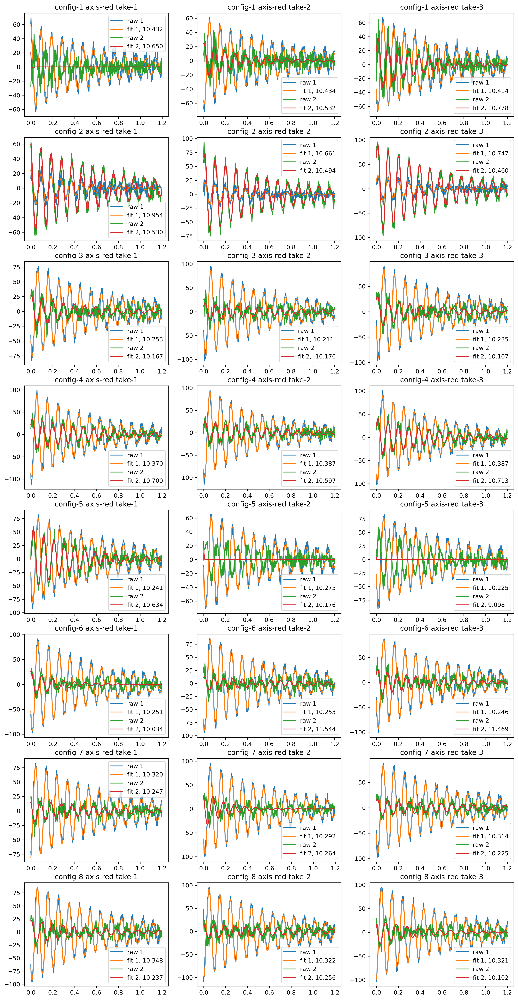

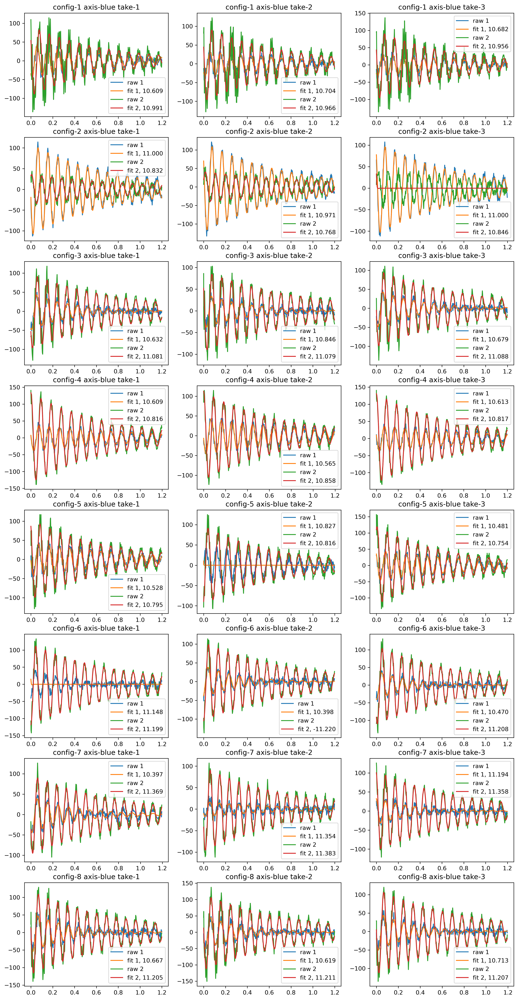

In [46]:
red_freq = np.zeros((len(configs), 3))
blue_freq = np.zeros((len(configs), 3))

fig1, ax1 = plt.subplots(len(configs), 3, dpi=300, figsize=(15, 30))
fig2, ax2 = plt.subplots(len(configs), 3, dpi=300, figsize=(15, 30))
for id, (conf_no, take_no) in enumerate(itertools.product(configs, takes)):
    # if conf_no != 3:
    #     continue
    axis = 'red'
    print(conf_no, axis, take_no)
    raw_data = np.load(fname.format(conf_no, axis, take_no))
    selected_raw = clean_raw_data(raw_data)
    data = reduce_segment(selected_raw)
    t = data[:, 0] - data[0, 0]
    ax1[id // 3, id % 3].set_title(f"config-{conf_no} axis-{axis} take-{take_no}")

    for col in y_col:
        y = data[:, col] - data[:, col].mean()
        # guess = np.array((np.abs(y).max(), 10.5, 1., y.mean(), 0.6))
        guess = np.array((np.abs(y).max(), 10.5, 1., 0.6))
        # if col == 2:
        #     guess = np.array((np.abs(y).max(), 10., 1., 0.6))
        res = opt.minimize(cost, guess, (t, y))
        print(res.x)
        if conf_no != 2 and col == 1:
            red_freq[id // 3, id % 3] = res.x[1]
        elif conf_no == 2 and col == 2: 
            red_freq[id // 3, id % 3] = res.x[1]
            
        ################
        # res = opt.minimize(cost, (1000, 10, 0.1, -50, 0.1), (t, y))
        # print(res.x)
        ax1[id // 3, id % 3].plot(t, y, label=f"raw {col}")
        ax1[id // 3, id % 3].plot(t, model(res.x, t), label=f"fit {col}, {res.x[1]:.3f}")
            ################
            # break
    ax1[id // 3, id % 3].legend()
    
    axis = 'blue'
    print(conf_no, axis, take_no)
    raw_data = np.load(fname.format(conf_no, axis, take_no))
    selected_raw = clean_raw_data(raw_data)
    if conf_no == 7 and take_no == 3:
        selected_raw = clean_raw_data(raw_data, hit_cut=450)
    data = reduce_segment(selected_raw)
    t = data[:, 0] - data[0, 0]
    ax2[id // 3, id % 3].set_title(f"config-{conf_no} axis-{axis} take-{take_no}")

    for col in y_col:
        y = data[:, col] - data[:, col].mean()
        # guess = np.array((np.abs(y).max(), 10.5, 1., y.mean(), 0.6))
        guess = np.array((np.abs(y).max(), 11., 1., 0.6))
        # if col == 2:
        #     guess = np.array((np.abs(y).max(), 10., 1., 0.6))
        res = opt.minimize(cost, guess, (t, y))
        print(res.x)
        if conf_no != 2 and col == 2:
            blue_freq[id // 3, id % 3] = res.x[1]
        elif conf_no == 2 and col == 1: 
            blue_freq[id // 3, id % 3] = res.x[1]

        ################
        # res = opt.minimize(cost, (1000, 10, 0.1, -50, 0.1), (t, y))
        # print(res.x)
        ax2[id // 3, id % 3].plot(t, y, label=f"raw {col}")
        ax2[id // 3, id % 3].plot(t, model(res.x, t), label=f"fit {col}, {res.x[1]:.3f}")
    ax2[id // 3, id % 3].legend()

In [47]:
red_freq = np.abs(red_freq)
red_mean = red_freq.mean(axis=1)
red_std = red_freq.std(axis=1) * np.sqrt(1.5)
blue_freq = np.abs(blue_freq)
blue_mean = blue_freq.mean(axis=1)
blue_std = blue_freq.std(axis=1) * np.sqrt(1.5)

<ErrorbarContainer object of 3 artists>

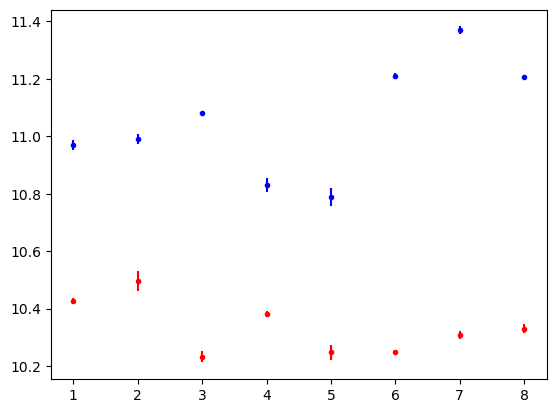

In [48]:
plt.errorbar(configs, red_mean, red_std, c='red', ls='', marker='.')
plt.errorbar(configs, blue_mean, blue_std, c='blue', ls='', marker='.')